<a href="https://colab.research.google.com/github/chaitanmeshram/Dog-Breed-Classification-Model/blob/main/Dog_Vision_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#mounting google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
#updating tensor flow version to the latest one
try:
  # %tensorflow_version only exists in Colab
  %tensorflow_version 2.x
except Exception:
  pass

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [3]:
#importing tensorflow.py
import tensorflow as tf
import tensorflow_hub as hub

print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)

# Check for GPU
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.15.0
Hub version: 0.16.1
GPU available (YESS!!!!)


In [4]:
#Getting data ready
# Use the '-d' parameter as the destination for where the files should go
#!unzip "drive/My Drive/Data/dog-breed-identification.zip" -d "drive/My Drive/Data/"

In [12]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/New folder/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


Looking at this, we can see there are 10222 different ID's (meaning 10222 different images) and 120 different breeds.

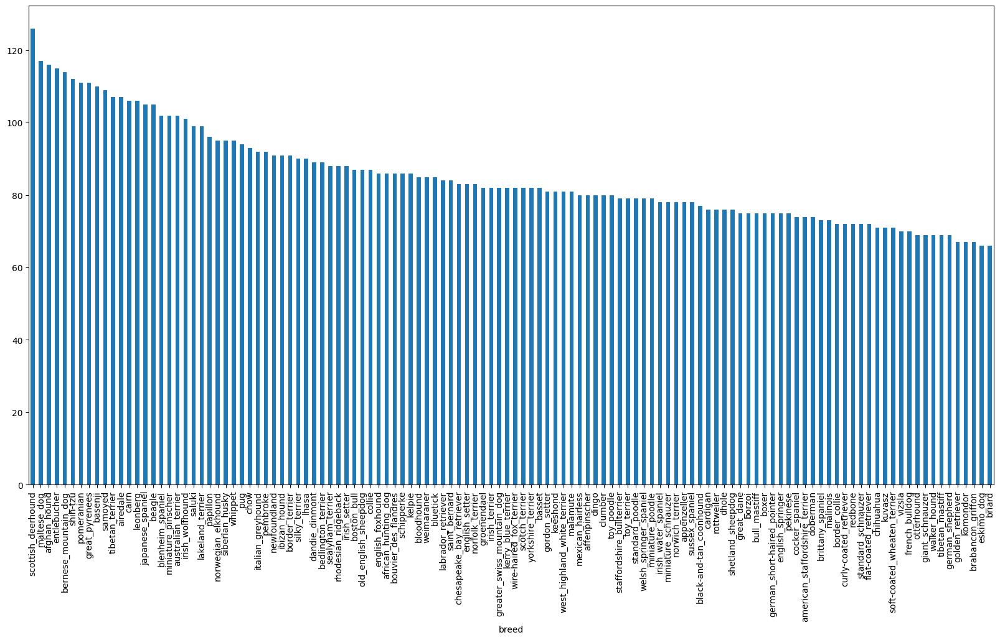

In [6]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

In [7]:
#image visualization
from IPython.display import display, Image
#Image("drive/MyDrive/Dog Vision/New folder/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels
We'll only create a list of filepaths to images rather than importing them all to begin with. This is because working with filepaths (strings) is much efficient than working with images.

In [13]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/New folder/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10 filenames
filenames[:10]

['drive/MyDrive/Dog Vision/New folder/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/New folder/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/New folder/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/New folder/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/New folder/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/New folder/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/New folder/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/New folder/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/New folder/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/New folder/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
# Check whether number of filenames matches number of actual image files
import os
print(len( os.listdir("drive/MyDrive/Dog Vision/New folder/train/")))

print(len(filenames))


if len(os.listdir("drive/MyDrive/Dog Vision/New folder/train/")) == len(filenames):
  print("Filenames match actual amount of files!")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

10252
10222
Filenames do not match actual amount of files, check the target directory.


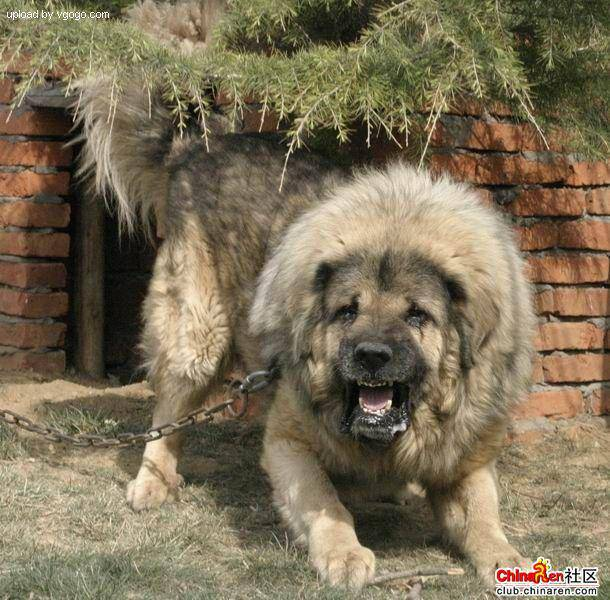

In [ ]:
# Check an image directly from a filepath
Image(filenames[9000])

## Turning labels_csv into NumPy array using filepaths

In [14]:
import numpy as np
labels = labels_csv["breed"].to_numpy() # convert labels column to NumPy array
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

comparing the amount of labels to number of filenames.

In [15]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories.")

Number of labels matches number of filenames!


since a machine learning model can't take strings as input (what `labels` currently is), we'll have to convert our labels to numbers.

To begin with, we'll find all of the unique dog breed names.

Then we'll go through the list of `labels` and compare them to unique breeds and create a list of booleans indicating which one is the real label (`True`) and which ones aren't (`False`).

In [16]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

Now use `unique_breeds` to help turn our `labels` array into an array of booleans.

In [17]:
# Example: Turn one label into an array of booleans
print(labels[0])
labels[0] == unique_breeds # use comparison operator to create boolean array

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [18]:
# Turn every label into a boolean array
boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### we've transformed single dog breed name such as boston_bull into a one-hot array.

In [19]:
# Example: Turning a boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])[0][0]) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


###Creating our own validation set by using train-test split function

For accessibility later, let's save our filenames variable to X (data) and our labels to y.


In [20]:
# Setup X & y variables
X = filenames
y = boolean_labels

Working with portion of images to make sure things are working before training on them all, as computing with 10,000+ images could take a fairly long time.

In [23]:
# Set number of images to use for experimenting
NUM_IMAGES = 7000 #@param {type:"slider", min:1000, max:10000, step:1000}
NUM_IMAGES

7000

spliting our data into training and validation sets. We'll use and 80/20 split (80% training data, 20% validation data).

In [24]:
# Import train_test_split from Scikit-Learn
from sklearn.model_selection import train_test_split

# Split them into training and validation using NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(5600, 5600, 1400, 1400)

In [25]:
# Check out the training data (image file paths and labels)
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/New folder/train/1986d8c21c77b80cd81c2b2e1fe24665.jpg',
  'drive/MyDrive/Dog Vision/New folder/train/9fc99626f294cd981ef5bdf6fca91b4a.jpg',
  'drive/MyDrive/Dog Vision/New folder/train/60666d549888377cc4af1c64d087e5d4.jpg',
  'drive/MyDrive/Dog Vision/New folder/train/41b3839dbe5686a95e0209f8dd6ca123.jpg',
  'drive/MyDrive/Dog Vision/New folder/train/ad7d271bedbe576ccbf5c646e4ddcbc2.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False,  True, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
   

### Preprocessing images (turning images into Tensors)

Our labels are in numeric format but our images are file paths.

Since we're using TensorFlow, our data has to be in the form of Tensors.

A Tensor is a way to represent information in numbers. If you're familar with NumPy arrays (you should be), a Tensor can be thought of as a combination of NumPy arrays, except with the special ability to be used on a GPU.

You might be wondering why (224, 224), which is (heigh, width). It's because this is the size of input our model (we'll see this soon) takes, an image which is (224, 224, 3).

What? Where's the 3 from? We're getting ahead of ourselves but that's the number of colour channels per pixel, red, green and blue.

In [26]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42]) # read in an image
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Building a function to process images

In [27]:
# Define image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image


### Creating data batches

In [28]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

we'll create a function to make data batches.

In [29]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [30]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [31]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing data batches

In [32]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

To view data in a batch, we've got to unwind it.
We can do so by calling the as_numpy_iterator() method on a data batch.
This will turn our a data batch into something which can be iterated over. Passing an iterable to next() will return the next item in the iterator.In our case, next will return a batch of 32 images and label pairs.

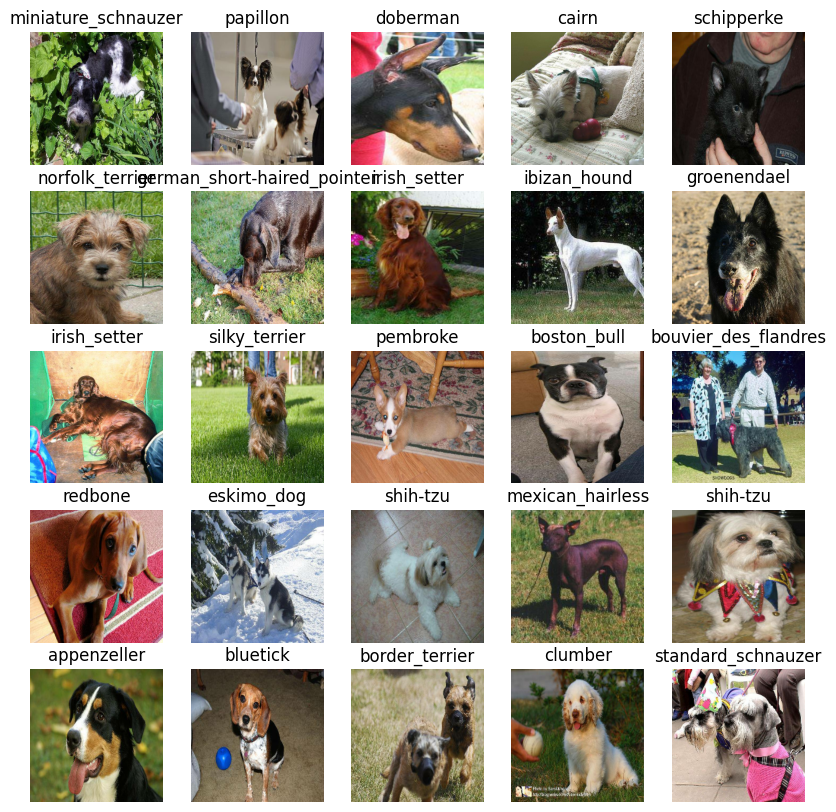

In [33]:
# Visualize training images from the training data batch
#This cell of code returns randomised set of images on each run
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

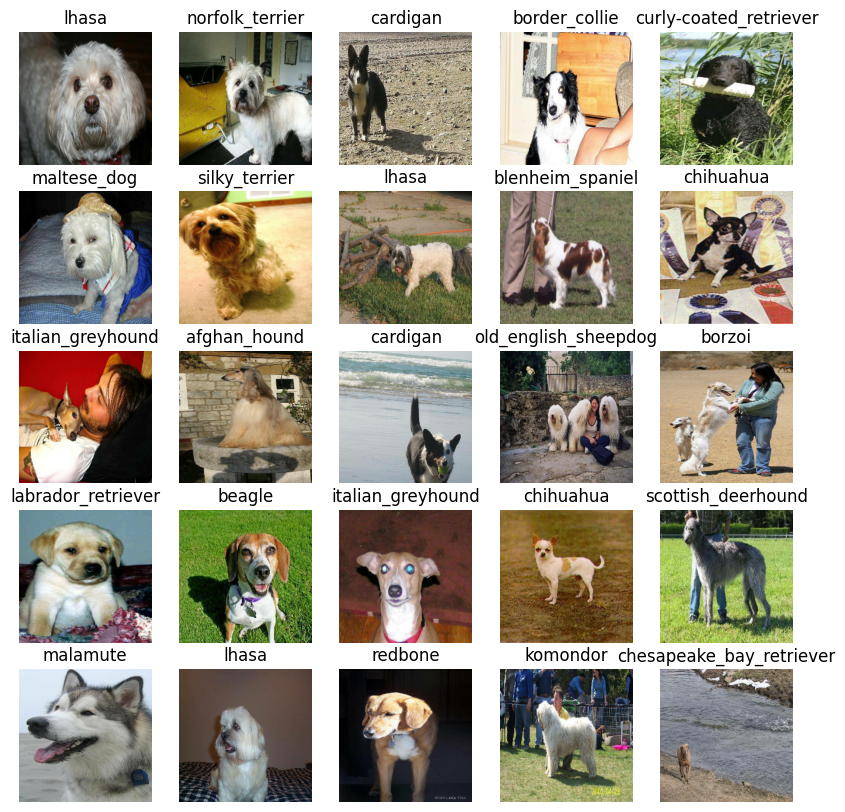

In [34]:
# Visualize validation images from the validation data batch
#This line returns the same set of images in each run
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Creating and training a model using Transfer learning

Model used: [mobilenet_v2_130_224](https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4)

### Building a model



In [35]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [36]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

#### Setting up the model layers using sequential API
API Used : [sequential API](https://www.tensorflow.org/guide/keras/overview#build_a_simple_model).

The first layer we use is the model from TensorFlow Hub (`hub.KerasLayer(MODEL_URL)`. So our first layer is actually an entire model (many more layers). This **input layer** takes in our images and finds patterns in them based on the patterns [`mobilenet_v2_130_224`](https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4) has found.

The next layer (`tf.keras.layers.Dense()`) is the **output layer** of our model. It brings all of the information discovered in the input layer together and outputs it in the shape we're after, 120 (the number of unique labels we have).

The `activation="softmax"` parameter tells the output layer, we'd like to assign a probability value to each of the 120 labels [somewhere between 0 & 1](https://en.wikipedia.org/wiki/Softmax_function). The higher the value, the more the model believes the input image should have that label. If we were working on a binary classification problem, we'd use `activation="sigmoid"`.

In [37]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Creating callbacks
Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.
#### TensorBoard Callback

[TensorBoard](https://www.tensorflow.org/tensorboard/get_started) helps provide a visual way to monitor the progress of your model during and after training.

It can be used [directly in a notebook](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) to track the performance measures of a model such as loss and accuracy.

In [38]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [39]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Data/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

#### Early Stopping Callback

[Early stopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping) helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

In [40]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

### Training a model (on a subset of data)
Our first model is only going to be trained on 1000 images. Or trained on 800 images and then validated on 200 images, meaning 1000 images total or about 10% of the total data.

The final parameter we'll define before training is `NUM_EPOCHS` (also known as **number of epochs**).

`NUM_EPOCHS` defines how many passes of the data we'd like our model to do. A pass is equivalent to our model trying to find patterns in each dog image and see which patterns relate to each label.

In [41]:
# Check again if GPU is available (otherwise computing will take a looooonnnnggggg time)
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESS!!!!)


In [43]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [44]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])

  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
175/175 [==============================] - 712s 4s/step - loss: 1.8544 - accuracy: 0.5741 - val_loss: 0.8068 - val_accuracy: 0.7807
Epoch 2/100
175/175 [==============================] - 401s 2s/step - loss: 0.4379 - accuracy: 0.8816 - val_loss: 0.7211 - val_accuracy: 0.7786
Epoch 3/100
175/175 [==============================] - 454s 3s/step - loss: 0.2386 - accuracy: 0.9430 - val_loss: 0.7176 - val_accuracy: 0.7900
Epoch 4/100
175/175 [==============================] - 395s 2s/step - loss: 0.1473 - accuracy: 0.9741 - val_loss: 0.7042 - val_accuracy: 0.7886
Epoch 5/100
175/175 [==============================] - 386s 2s/step - loss: 0.0995 - accuracy: 0.9855 - val_loss: 0.7028 - val_accuracy: 0.7936
Epoch 6/100
175/175 [==============================] - 387s 2s/step - loss: 0.0686 - accuracy: 0.9936 - val_loss: 0.7035 - val_accuracy: 0.7921
Epoch 7/100
175/175 [======================

#### Checking the TensorBoard logs
The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and viualize its contents.

In [45]:
%tensorboard --logdir drive/My\ Drive/Data/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model
Making predictions with a trained model is as calling `predict()` on it and passing it data in the same format the model was trained on.

In [46]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

44/44 [==============================] - 553s 13s/step


array([[0.00045602, 0.00795136, 0.00485883, ..., 0.01284157, 0.00144784,
        0.00120036],
       [0.0019432 , 0.0047036 , 0.00411557, ..., 0.00207271, 0.0020746 ,
        0.00538469],
       [0.00288557, 0.00161447, 0.00030448, ..., 0.00989504, 0.00070706,
        0.00803993],
       ...,
       [0.00471639, 0.00120898, 0.00161522, ..., 0.00996478, 0.02009939,
        0.00474393],
       [0.01655692, 0.01352226, 0.00271847, ..., 0.0065267 , 0.00665923,
        0.00072315],
       [0.02015989, 0.01104952, 0.00058439, ..., 0.02224697, 0.00230414,
        0.0158407 ]], dtype=float32)

In [47]:
# Check the shape of predictions
predictions.shape

(1400, 120)

In [48]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

[0.00045602 0.00795136 0.00485883 0.00391123 0.00046654 0.0037058
 0.00829959 0.00408754 0.00289544 0.00066078 0.00319427 0.0010126
 0.01621419 0.02364031 0.00692749 0.00274268 0.00109622 0.00422587
 0.0060612  0.00464113 0.00189805 0.00061367 0.0028492  0.00951937
 0.07516358 0.0058305  0.00027906 0.00473532 0.00163106 0.00052231
 0.00513322 0.01000615 0.0079645  0.00059053 0.00944841 0.00018264
 0.0230395  0.00540365 0.00060905 0.00121531 0.00176522 0.00284842
 0.00422819 0.01095198 0.01101157 0.00257182 0.00675358 0.00059134
 0.01973682 0.01509324 0.00409568 0.00038814 0.00639235 0.00106576
 0.00580153 0.00538116 0.00883063 0.00035361 0.00632399 0.02686787
 0.0001565  0.00011803 0.00607242 0.00067878 0.01886239 0.0027968
 0.01119584 0.00666608 0.01329736 0.00774772 0.00493871 0.00306802
 0.05240346 0.00090741 0.00058159 0.00099305 0.00533489 0.00101874
 0.00973315 0.00083256 0.01760036 0.00322778 0.0338103  0.0021674
 0.00124591 0.00380085 0.00298089 0.00180204 0.00543974 0.00790691

let's first build a little function to convert prediction probabilities into predicted labels.

In [49]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'toy_terrier'

Since our validation data (`val_data`) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using [`unbatch()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#unbatch)) and then turn it into an iterator using [`as_numpy_iterator()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#as_numpy_iterator).

Let's make a small function to do so.

In [50]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.25430673, 0.2582283 , 0.23862046],
         [0.28700584, 0.2909274 , 0.27131957],
         [0.31946117, 0.32338274, 0.3037749 ],
         ...,
         [0.05490196, 0.04705883, 0.        ],
         [0.0627451 , 0.03529412, 0.        ],
         [0.0627451 , 0.03529412, 0.        ]],
 
        [[0.25144434, 0.2553659 , 0.23575807],
         [0.2816264 , 0.28554797, 0.26594013],
         [0.31372795, 0.3176495 , 0.29804167],
         ...,
         [0.05203957, 0.04419643, 0.        ],
         [0.0656075 , 0.03815651, 0.        ],
         [0.0656075 , 0.03815651, 0.        ]],
 
        [[0.2459405 , 0.24986207, 0.23025423],
         [0.27579656, 0.27971813, 0.2601103 ],
         [0.30575985, 0.30968142, 0.29007357],
         ...,
         [0.04620974, 0.03751751, 0.        ],
         [0.06282878, 0.04574335, 0.00477066],
         [0.06804097, 0.04313726, 0.00477066]],
 
        ...,
 
        [[0.07209384, 0.07601541, 0.04464286],
         [0.07058824, 0.07450981, 0.05098

Visualizing an image, its predicted label and its actual label (true label).

In [51]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

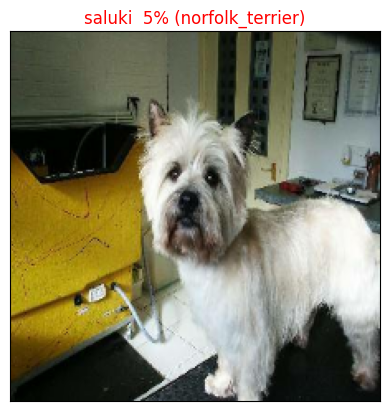

In [52]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

it would also be good to see what other guesses our model is making. More specifically, if our model predicts a certain label with 24% probability, what else did it predict?

Let's build a function to demonstrate. The function will:

Take an input of a prediction probabilities array, a ground truth labels array and an integer.
Find the predicted label using get_pred_label().
Find the top 10:
Prediction probabilities indexes
Prediction probabilities values
Prediction labels
Plot the top 10 prediction probability values and labels, coloring the true label green.

In [53]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

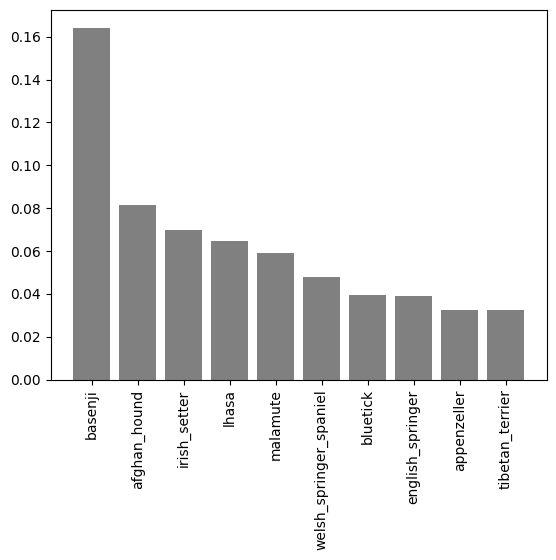

In [54]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Checking onto some of the functions to help us visualize our predictions and evaluate our model.

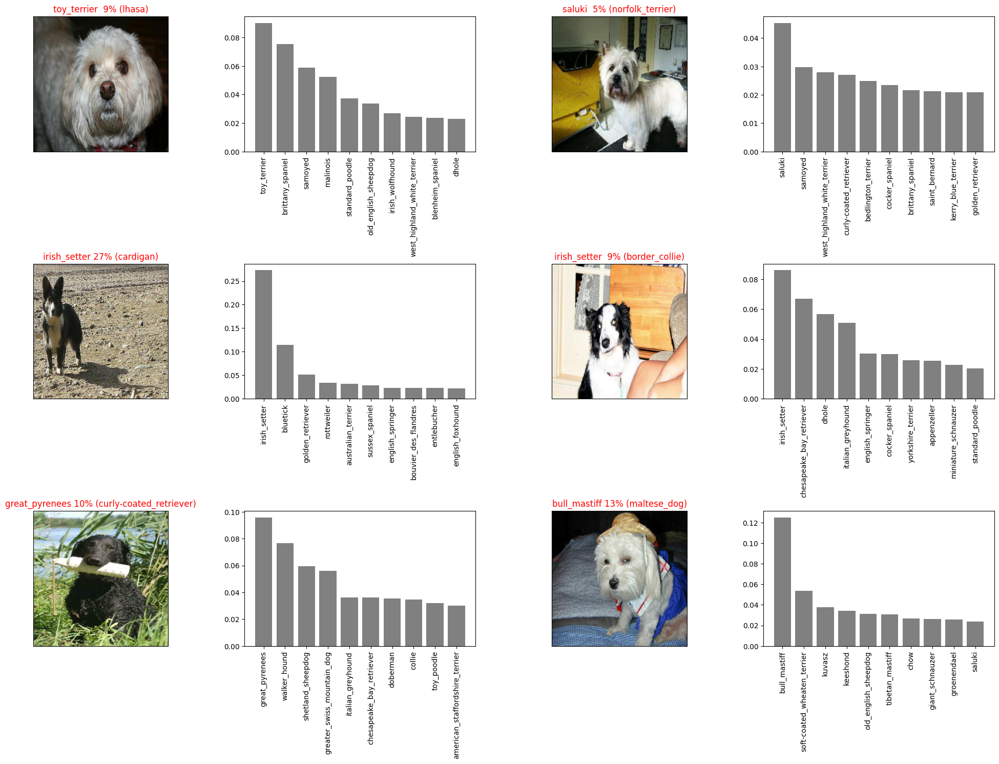

In [55]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a model
The format of an [entire saved Keras model is h5](https://www.tensorflow.org/tutorials/keras/save_and_load). So we'll make a function which can take a model as input and utilise the [`save()`](https://www.tensorflow.org/tutorials/keras/save_and_load#savedmodel_format) method to save it as a h5 file to a specified directory.

In [56]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

If we've got a saved model, we'd like to load it, let's create a function which can take a model path and use the [`tf.keras.models.load_model()`](https://www.tensorflow.org/api_docs/python/tf/keras/models/load_model) function to load it into the notebook.

Because we're using a component from TensorFlow Hub (`hub.KerasLayer`) we'll have to pass this as a parameter to the `custom_objects` parameter.

In [57]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [58]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/My Drive/Data/models/20240630-09061719738394-1000-images-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Data/models/20240630-09061719738394-1000-images-Adam.h5'

In [59]:
# Load our model trained on 1000 images
model_1000_images = load_model('drive/MyDrive/Data/models/20240627-20391719520745-1000-images-Adam.h5')

Loading saved model from: drive/MyDrive/Data/models/20240627-20391719520745-1000-images-Adam.h5


Compare the two models (the original one and loaded one). We can do so easily using the `evaluate()` method.

In [60]:
# Evaluate the pre-saved model
model.evaluate(val_data)

44/44 [==============================] - 7s 150ms/step - loss: 5.7304 - accuracy: 0.0093


[5.730433464050293, 0.009285714477300644]

In [61]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

44/44 [==============================] - 6s 122ms/step - loss: 0.7660 - accuracy: 0.8014


[0.7659841775894165, 0.8014285564422607]

## Training a model (on the full data)
Earlier, we saved all of the training filepaths to `X` and all of the training labels to `y`. Let's check them out.

In [62]:
# Turn full training data in a data batch
full_data = create_data_batches(X, y)

Creating training data batches...


In [63]:
# Instantiate a new model for training on the full dataset
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


Since we've made a new model instance, full_model, we'll need some callbacks too.

In [64]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 576s 2s/step - loss: 1.3580 - accuracy: 0.6676
Epoch 2/100
320/320 [==============================] - 568s 2s/step - loss: 0.4095 - accuracy: 0.8770
Epoch 3/100
320/320 [==============================] - 570s 2s/step - loss: 0.2379 - accuracy: 0.9360
Epoch 4/100
320/320 [==============================] - 566s 2s/step - loss: 0.1545 - accuracy: 0.9634
Epoch 5/100
320/320 [==============================] - 572s 2s/step - loss: 0.1073 - accuracy: 0.9772
Epoch 6/100
320/320 [==============================] - 571s 2s/step - loss: 0.0775 - accuracy: 0.9860
Epoch 7/100
320/320 [==============================] - 578s 2s/step - loss: 0.0580 - accuracy: 0.9921
Epoch 8/100
320/320 [==============================] - 573s 2s/step - loss: 0.0476 - accuracy: 0.9937
Epoch 9/100
320/320 [==============================] - 569s 2s/step - loss: 0.0376 - accuracy: 0.9961
Epoch 10/100
320/320 [==============================] - 574s 2s/step - loss: 0.031

In [65]:
# Save model to file
save_model(full_model, suffix="all-images-Adam")

Saving model to: drive/My Drive/Data/models/20240630-09071719738446-all-images-Adam.h5...


'drive/My Drive/Data/models/20240630-09071719738446-all-images-Adam.h5'

In [66]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/Data/models/20240628-02471719542830-all-images-Adam.h5')

Loading saved model from: drive/MyDrive/Data/models/20240628-02471719542830-all-images-Adam.h5


### Making predictions on the test dataset


In [67]:
# Load test image filenames (since we're using os.listdir(), these already have .jpg)
test_path = "drive/MyDrive/Dog Vision/New folder/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['drive/MyDrive/Dog Vision/New folder/test/e2ef94a22af1d5375132de4eb19d2a64.jpg',
 'drive/MyDrive/Dog Vision/New folder/test/e857866af777793d2c114b09ea7a685a.jpg',
 'drive/MyDrive/Dog Vision/New folder/test/eb9f2db3d5204c85c26daeb7669b20a3.jpg',
 'drive/MyDrive/Dog Vision/New folder/test/f4db24d71e6f3100614eb4543f98394f.jpg',
 'drive/MyDrive/Dog Vision/New folder/test/e8319b1410a984291d71a3e60c84d86c.jpg',
 'drive/MyDrive/Dog Vision/New folder/test/efac70ee513c40265966b89d715f183e.jpg',
 'drive/MyDrive/Dog Vision/New folder/test/ed3b2e79859710376b7a91379234b1ec.jpg',
 'drive/MyDrive/Dog Vision/New folder/test/ee0582b96b135f5e036e011d53baa087.jpg',
 'drive/MyDrive/Dog Vision/New folder/test/f16eed64196d24c423f0a68d7ebf287d.jpg',
 'drive/MyDrive/Dog Vision/New folder/test/f054f5578e5c9d3f6759b357df3c5f16.jpg']

In [68]:
# How many test images are there?
len(test_filenames)

10397

In [69]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [70]:
# Make predictions on test data batch using the loaded full model (It may take longer time than expected)
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

325/325 [==============================] - 377s 1s/step


In [71]:
# Check out the test predictions
test_predictions[:10]

array([[0.00162671, 0.00062747, 0.00524158, ..., 0.03228818, 0.00249657,
        0.01044548],
       [0.00443801, 0.00171562, 0.00582476, ..., 0.02724435, 0.00600128,
        0.00675518],
       [0.00107615, 0.00204649, 0.00312942, ..., 0.0030285 , 0.00094605,
        0.00044786],
       ...,
       [0.00104898, 0.00032941, 0.00370053, ..., 0.00140249, 0.00492431,
        0.00073978],
       [0.00257027, 0.00094902, 0.0010386 , ..., 0.01313565, 0.00052173,
        0.00034168],
       [0.01495103, 0.01581803, 0.02162018, ..., 0.00176752, 0.12979917,
        0.00431218]], dtype=float32)

In [72]:
### Preparing test dataset predictions for Kaggle
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [88]:
# Append test image ID's to predictions DataFrame
test_path = "drive/MyDrive/Dog Vision/New folder/test/"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2ef94a22af1d5375132de4eb19d2a64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e857866af777793d2c114b09ea7a685a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,eb9f2db3d5204c85c26daeb7669b20a3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f4db24d71e6f3100614eb4543f98394f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e8319b1410a984291d71a3e60c84d86c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [89]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e2ef94a22af1d5375132de4eb19d2a64,0.001627,0.000627,0.005242,0.006445,0.008712,0.015038,0.021061,0.002487,0.002270,...,0.003651,0.039205,0.009322,0.003339,0.022937,0.013628,0.027316,0.032288,0.002497,0.010445
1,e857866af777793d2c114b09ea7a685a,0.004438,0.001716,0.005825,0.012133,0.002988,0.001166,0.003493,0.006271,0.008811,...,0.050882,0.003139,0.006186,0.015732,0.008356,0.033210,0.002592,0.027244,0.006001,0.006755
2,eb9f2db3d5204c85c26daeb7669b20a3,0.001076,0.002046,0.003129,0.000217,0.000727,0.006883,0.013244,0.016532,0.000353,...,0.004066,0.001239,0.007204,0.010471,0.001893,0.007995,0.000180,0.003028,0.000946,0.000448
3,f4db24d71e6f3100614eb4543f98394f,0.008000,0.041356,0.002943,0.001335,0.003499,0.009766,0.016596,0.058513,0.010079,...,0.000318,0.003212,0.012421,0.009655,0.047607,0.010260,0.010491,0.001911,0.001520,0.001542
4,e8319b1410a984291d71a3e60c84d86c,0.001685,0.005166,0.001258,0.004351,0.005940,0.005627,0.006096,0.010944,0.000812,...,0.009595,0.001026,0.002692,0.005644,0.001285,0.007812,0.000600,0.000445,0.000456,0.000860


now export our predictions DataFrame to CSV so we can submit it to Kaggle.

In [74]:
preds_df.to_csv("drive/MyDrive/Data/full_submission_1_mobilienetV2_adam.csv",
                 index=False)

###Making Predictions on Custom images

In [110]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/New folder/my-dogs/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

# Turn custom image into batch (set to test data because there are no labels)


In [111]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [112]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 898ms/step


Now we've got some predictions arrays, let's convert them to labels and compare them with each image.

In [113]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['bull_mastiff', 'beagle', 'malinois']

In [114]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

# Check custom image predictions

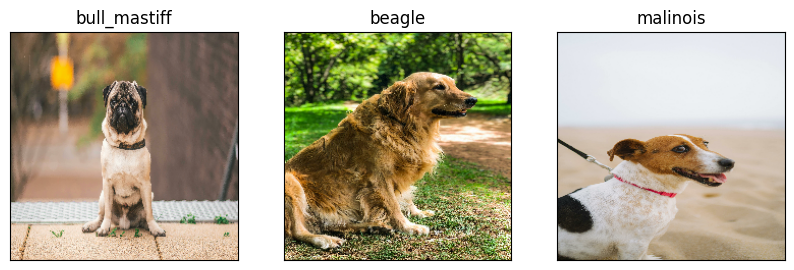

In [115]:
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)